In [1]:
import pandas as pd
import geopandas as gpd
import osmnx as ox
import matplotlib.pyplot as plt
import plotly as py
from shapely.geometry import Point, Polygon
import plotly.express as px
import requests
import json

%matplotlib inline

Paris is hosting the Paralympics in 2024. One of the events at the Paralympics is an open water
swimming event in the Seine (apparently the water is clean or so the French say). Since the City
of Amsterdam thinks it is beter than Paris, they want to host an event before the Paralympics,
snubbing the Parisians. The idea is to host a 5km. open water swimming event through the
canals of Amsterdam. You are asked by the municipality of Amsterdam to advise on the
feasibility of the event from the perspecptive of the safety of the partaking athletes from an
environmental perspective. The event is going to be hosted in May.

For this exercise you have chosen a route in Amsterdam for the canal swimming event.
Preferably you have this route calculated using Python. You can set a start point and an end
point and then try to find a route that has a certain distance (min. 5 km.)

The Municipality wants you to find a location for the Event Headquarters. They decided it
would be best if this E.H. is as close to the centre of the swimming route. There is a bit of a
concern for the after party and the stream of visitors. They want you to quantify the number of
visitors that can reach the event and the capacity for festivities after the event

Location of swimming route is calculated based on previous findings

In [7]:
city_name = "Amsterdam"

water = ox.geometries.geometries_from_place( city_name, tags={'natural' : 'water'})

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_16892\240874422.py:3: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  water = ox.geometries.geometries_from_place( city_name, tags={'natural' : 'water'})


In [8]:
url_pol = "https://maps.amsterdam.nl/open_geodata/geojson_lnglat.php?KAARTLAAG=RAINPROOF_POLDERRIOOL&THEMA=rainproof"
response_pol = requests.get(url_pol)
gdf_pol = gpd.read_file(response_pol.text)

In [9]:
gdf_boat = gpd.read_file("Amsterdam_canal_routes.geojson")

In [10]:
df_zwemwater =  pd.read_csv("ZWEMWATER.csv", sep = ";")
df_zwemplek = df_zwemwater[df_zwemwater['Categorie']=="Zwemplek"]
print(df_zwemplek.head())
gdf_zwemplek = gpd.GeoDataFrame(df_zwemplek[['OBJECTNUMMER', "LNG", "LAT", "Categorie"]],
    geometry=gpd.points_from_xy(df_zwemplek.LNG, df_zwemplek.LAT), crs="WGS84")

    OBJECTNUMMER                 Naam_locatie Categorie  \
0             43                  Nieuwe Meer  Zwemplek   
6             57                   Diemerpark  Zwemplek   
7             59                  Gaasperplas  Zwemplek   
8             60  Zandstrand, Ouderkerkerplas  Zwemplek   
21           130                Strand IJburg  Zwemplek   

                    WKT_LNG_LAT                  WKT_LAT_LNG       LNG  \
0   POINT(4.8466042 52.3329068)  POINT(52.3329068 4.8466042)  4.846604   
6   POINT(4.9864841 52.3542671)  POINT(52.3542671 4.9864841)  4.986484   
7   POINT(4.9966011 52.3033752)  POINT(52.3033752 4.9966011)  4.996601   
8    POINT(4.929492 52.2950172)   POINT(52.2950172 4.929492)  4.929492   
21  POINT(5.0148267 52.3569806)  POINT(52.3569806 5.0148267)  5.014827   

          LAT  Unnamed: 7  
0   52.332907         NaN  
6   52.354267         NaN  
7   52.303375         NaN  
8   52.295017         NaN  
21  52.356981         NaN  


In [11]:
df_swimm =  pd.read_csv("Swimming.csv")
print(df_swimm.head())
gdf_swimm = gpd.GeoDataFrame(df_swimm[['place', "LNG", "LAT"]],
    geometry=gpd.points_from_xy(df_swimm.LAT, df_swimm.LNG), crs="WGS84")

                           place        LNG       LAT
0                     sloterplas  52.368439  4.822760
1                  Marineterrein  52.373323  4.915827
2                     Het Twiske  52.449236  4.887567
3  Admiralengracht, erasmus park  52.376215  4.854653
4        Berlagebrug Rowing Club  52.348145  4.912280


In [27]:
fig, ax = plt.subplots(figsize=(200,200))
ax.set_aspect('equal')
ax.set_facecolor('#ffffff')

water.plot(ax=ax, color="lightblue")
gdf_zwemplek.plot(ax=ax, marker = 'o', markersize = 3000, color="lightgreen")
gdf_pol.plot(ax=ax, color= "#FF8700")
gdf_swimm.plot(ax=ax, marker = 'o', markersize = 3000, color="darkgreen")
gdf_boat.plot(ax=ax, color= "#D22B2B", linewidth = 20)

plt.savefig("waterways_amsterdam.png")

In [28]:
city_name = "Centrum Amsterdam"

water_center = ox.geometries.geometries_from_place( city_name, tags={'natural' : 'water'})

C:\Users\julia\AppData\Local\Temp\ipykernel_26256\3385034054.py:3: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  water_center = ox.geometries.geometries_from_place( city_name, tags={'natural' : 'water'})


In [29]:
north = 52.378324
south = 52.337264
east = 4.939041
west = 4.886169

shape = Polygon([
    (west, north),
    (east, north),
    (east, south),
    (west, south),
    (west, north)])

swimm_cent = gdf_swimm.clip(shape)

In [30]:
fig, ax = plt.subplots(figsize=(200,200))
ax.set_aspect('equal')
ax.set_facecolor('#ffffff')

water_center.plot(ax=ax, color="lightblue")
# all the zempleks in amsterdam are too far out of the city center thus to low connectivity
#gdf_zwemplek.plot(ax=ax, marker = 'o', markersize = 3000, color="#FFC300")
swimm_cent.plot(ax=ax, marker = 'o', markersize = 10000, color="darkgreen")
gdf_boat.plot(ax=ax, color= "#D22B2B", linewidth = 50)

# plt.savefig("waterways_amsterdam.png")

<Axes: >

Find the centre of the nodes of the swimming route. See this link. - julian

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_16892\260643093.py:2: UserWarning: The `utils.config` function is deprecated and will be removed in a future release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`.
  ox.config(use_cache=True, log_console=True)


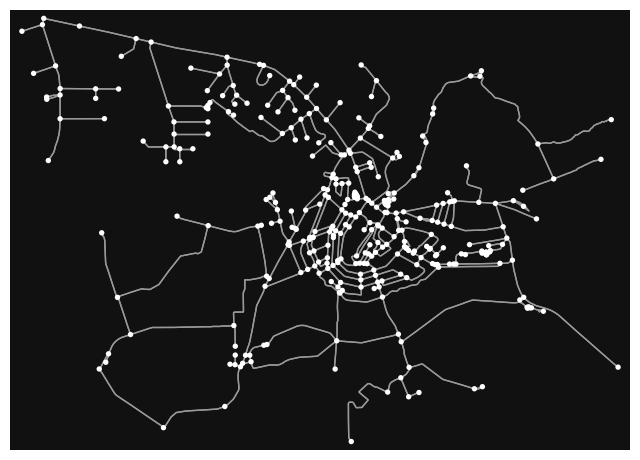

In [12]:
import osmnx as ox
ox.config(use_cache=True, log_console=True)

graph_water = ox.graph_from_place('Amsterdam', retain_all=False, truncate_by_edge=False,
                        simplify=True, custom_filter='["waterway"~"canal|river"]')

fig, ax = ox.plot_graph(graph_water)

In [13]:
node_id = list(graph_water.nodes)[0]
print(graph_water.nodes)

[46367195, 60739108, 60740166, 60740168, 60740843, 60740852, 60742002, 117738457, 117738466, 117738475, 117738484, 117738490, 117738503, 117738509, 117908628, 117953816, 117953820, 154512118, 154515615, 154516859, 154538128, 154546029, 178249893, 178249904, 178249906, 178249922, 178261156, 178261159, 178261171, 178269153, 178287360, 237852499, 237852501, 237852504, 237852506, 251749021, 251764623, 251823620, 251823623, 251823628, 252100239, 252116496, 252116503, 252142901, 277138134, 277141215, 277141219, 277141224, 288315918, 288316157, 301390460, 301487539, 301492457, 304072208, 304072209, 304817737, 304820077, 304825773, 305081090, 305081097, 305082709, 305083121, 305084168, 305084619, 305085083, 305085205, 305085534, 305086630, 305086634, 305155547, 305155548, 305156166, 311306136, 311308968, 311319542, 322374080, 322375093, 323521776, 323525433, 323901705, 323909108, 323909176, 323929882, 323968073, 323991338, 324010766, 324023636, 324089287, 324126395, 324128505, 324795591, 32479

In [14]:
# swimming_route_nodes = [323901852, 252142901, 331854233, 1280741285, 1146370151, 252111331, 7517098403, 178287382, 323929882, 324817202, 1146370114, 7517097397, 178287378, 323960830, 1146370149, 5924650337, 4446826075, 1146370142, 60740166, 178249906, 60740168, 323968073, 178287355, 178287357, 178287360, 252100239, 252100242, 5828130167, 323974742, 323974741, 323974740, 855298916, 323974739, 855298910, 323974738, 324814425, 324814546, 324814401, 324814399, 3781170134, 1276480053, 324815676, 2853837615, 323926433, 297863497, 323926433, 2853837615, 252116497, 323927212, 323909176, 252116496, 1280741337, 331854233, 252142901]

import gpxpy
import gpxpy.gpx

# read the swim route from the gpx file
import codecs
gpx_file = codecs.open('./swim_route.gpx', 'r', encoding='utf-8')
swim_route_gpx = gpxpy.parse(gpx_file)
gpx_file.close()
swim_route = []
for track in swim_route_gpx.tracks:
    for segment in track.segments:
        for point in segment.points:
            # find the nearest node in the graph_water for each coordinate
            nearest_node = ox.distance.nearest_nodes(graph_water, point.longitude, point.latitude, return_dist=True)
            if nearest_node[1] < 10:
                swim_route.append(nearest_node[0])

# remove duplicates from the swim route
swim_route_deduplicated = []
prev_elem = None
for elem in swim_route:
    if elem != prev_elem:
        swim_route_deduplicated.append(elem)
    prev_elem = elem
print(swim_route_deduplicated)

# find the shortest path between the nodes in the swim route
import networkx as nx
swim_route_path = []
for i in range(len(swim_route_deduplicated) - 1):
    path = nx.shortest_path(graph_water, swim_route_deduplicated[i], swim_route_deduplicated[i+1])
    swim_route_path.extend(path[1:]) # add all nodes except the first one to the path
print(swim_route_path)



[252142901, 331854233, 323929882, 60740166, 178249906, 60740168, 323968073, 178287360, 252100239, 3781170134, 2853837615, 323909176, 252116496, 8010136114, 331854233, 252142901]
[331854233, 323929882, 60740166, 178249906, 60740168, 323968073, 178287360, 252100239, 3781170134, 2853837615, 323909176, 252116496, 8010136114, 331854233, 252142901]


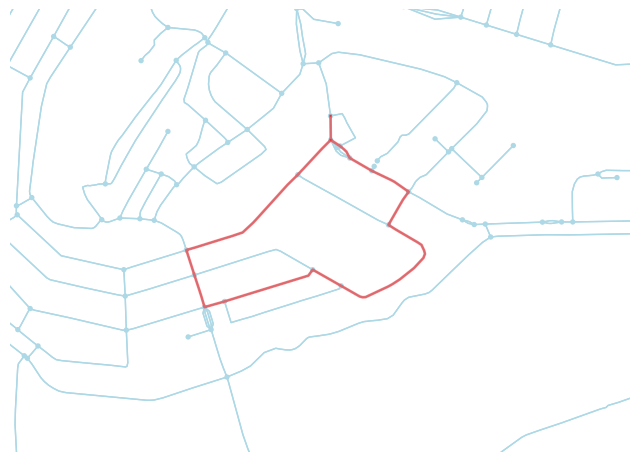

In [15]:
# plot the swim route on top of the water graph
bbox_ams_centre = (52.378324, 52.355264, 4.939041, 4.886169)
swim_route_fig, ax = ox.plot_graph_route(graph_water, swim_route_path, route_linewidth=2, route_color='red', show=True, orig_dest_size=2, bgcolor='white', node_color="lightblue", edge_color="lightblue", bbox=bbox_ams_centre, close=False)

Use the centre to find a suitable spot for the Event Headquarters. - julian

NameError: name 'water_center' is not defined

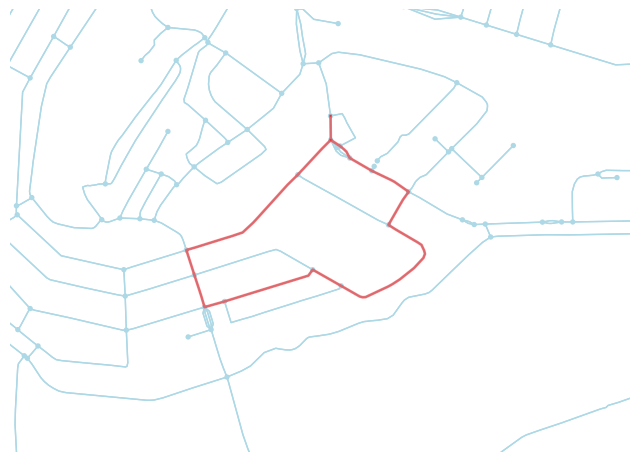

In [17]:
# find the nodes in the swim route
swim_route_nodes = []

for node in swim_route_path:
    swim_route_nodes.append(graph_water.nodes[node])

# find the centre of all the nodes in the swim route
average_x = 0.0
average_y = 0.0
for node in swim_route_nodes:
    average_x = average_x + node['x']
for node in swim_route_nodes:
    average_y = average_y + node['y']

average_x = average_x / len(swim_route_nodes)
average_y = average_y / len(swim_route_nodes)

# plot the centre of the swim route on the swim_route_fig
swim_route_fig, ax = ox.plot_graph_route(graph_water, swim_route_path, route_linewidth=2, route_color='red', show=False, orig_dest_size=2, bgcolor='white', node_color="lightblue", edge_color="lightblue", bbox=bbox_ams_centre, close=False)
water_center.plot(ax=ax, color="lightblue")
ax.scatter(average_x, average_y, s=100, c='red', marker='o', zorder=2)
plt.show()

In [18]:
print(average_x, average_y)

4.91153724 52.367861126666654


Find the closest bus and tram stops at the start and finish of the swimming route. How many people can be transported within an hour. - Lora



In [19]:
#Using OMNX to find the closest public transportation stops



#THESE ARE THE REAL COORDINATES
x_coor = 52.372870
y_coor = 4.914240
center_point = (x_coor,y_coor)

# Create a network graph within a certain distance of the target point
#G = ox.graph_from_point((lat, lon), network_type='all', dist=1000, simplify=True)

tags = {'public_transport':['stop_position']}


features = ox.features.features_from_point(center_point, tags=tags, dist=300)
#ox.features.features_from_point(center_point,tags ='shelter', dist=1000)
#print(features)
features.head()
#features.info()
#print(features.type())
#Apparently there is an issue with the distance?? is it in km or meters ?
#also need to make them in the right order + stating the distance 


bus                           name public_transport  \
element_type osmid                                                             
node         331854558   yes        Amsterdam, Kadijksplein    stop_position   
             1280741311  yes        Amsterdam, Kadijksplein    stop_position   
             2087644362  yes   Amsterdam, Kattenburgerplein    stop_position   
             2087644827  yes   Amsterdam, Kattenburgerplein    stop_position   
             4457168573  yes  Amsterdam, Kattenburgerstraat    stop_position   

                             ref:IFOPT                  geometry bench  bin  \
element_type osmid                                                            
node         331854558   NL:Q:30008028  POINT (4.91337 52.37092)   NaN  NaN   
             1280741311  NL:Q:30008027  POINT (4.91349 52.37081)   NaN  NaN   
             2087644362  NL:Q:30008015  POINT (4.91634 52.37062)   yes  yes   
             2087644827  NL:Q:30008025  POINT (4.91593 52.37075)   NaN  NaN   
             4457168573  NL:Q:30008032  POINT (4.91849 52.37272)   NaN  NaN   

                        shelter  
element_type osmid               
node         331854558      NaN  
             1280741311     NaN  
             2087644362     yes  
             2087644827     NaN  
             4457168573     NaN

In [20]:
features.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
MultiIndex: 6 entries, ('node', 331854558) to ('node', 4621705796)
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   bus               6 non-null      object  
 1   name              6 non-null      object  
 2   public_transport  6 non-null      object  
 3   ref:IFOPT         6 non-null      object  
 4   geometry          6 non-null      geometry
 5   bench             1 non-null      object  
 6   bin               1 non-null      object  
 7   shelter           1 non-null      object  
dtypes: geometry(1), object(7)
memory usage: 847.0+ bytes


In [21]:
features["x"] = features.centroid.x
features["y"] = features.centroid.y

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_16892\4105456575.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  features["x"] = features.centroid.x
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_16892\4105456575.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  features["y"] = features.centroid.y


In [22]:
import geopandas as gpd
from shapely.geometry import Point
from geopy.distance import great_circle

url_pol = "https://maps.amsterdam.nl/open_geodata/geojson_lnglat.php?KAARTLAAG=TRAMMETRO_PUNTEN_2022&THEMA=trammetro"
response_pol = requests.get(url_pol)
gdf_pol = gpd.read_file(response_pol.text)

x_coor = 52.372870
y_coor = 4.914240
target_point = Point(x_coor, y_coor)


gdf_pol['distance'] = gdf_pol['geometry'].apply(lambda stop: great_circle((x_coor, y_coor), (stop.y, stop.x)).meters)


closest_stops = gdf_pol.nsmallest(5, 'distance')


print(closest_stops)

                     Naam Modaliteit Lijn Lijn_select  RADIUS  \
121  Muziekgebouw Bimhuis       Tram   26          26       5   
122    Kattenburgerstraat       Tram   26          26       5   
76                  Artis       Tram   14          14       5   
79        Mr. Visserplein       Tram   14          14       5   
223    Plantage Lepellaan       Tram   14          14       5   

                         Label                  geometry    distance  
121  26 - Muziekgebouw Bimhuis  POINT (4.91302 52.37725)  493.685432  
122    26 - Kattenburgerstraat  POINT (4.92158 52.37612)  615.546946  
76                  14 - Artis  POINT (4.91117 52.36663)  724.698979  
79        14 - Mr. Visserplein  POINT (4.90570 52.36782)  807.082571  
223    14 - Plantage Lepellaan  POINT (4.91548 52.36513)  864.692573  


In [23]:
north = 52.3807
south = 52.3648
west = 4.9039
east = 4.920883

boundary_polygon = Polygon([(west, north), (east, north), (east, south), (west, south), (west, north)])

In [24]:
G = ox.graph_from_bbox(north, south, east, west)

In [25]:
water = ox.geometries.geometries_from_bbox(north, south, east, west, tags={'natural' : 'water'})
water = water.clip(boundary_polygon)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_16892\995979757.py:1: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  water = ox.geometries.geometries_from_bbox(north, south, east, west, tags={'natural' : 'water'})
c:\Users\LENOVO\miniconda3\envs\geo_env\lib\site-packages\geopandas\tools\clip.py:67: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


In [32]:
fig, ax = plt.subplots(figsize=(200,200))
ax.set_aspect('equal')
ax.set_facecolor('white')

ox.plot_graph(G, edge_color='grey', edge_linewidth = 10,
                        node_size=0,
                        show=False, close=False, ax=ax,)
water.plot(ax=ax, color="lightblue")
features.plot(ax=ax, markersize = 5000, color ="darkgreen")
closest_stops.plot(ax=ax, markersize = 5000, color = "orange")
swim_route_fig = ox.plot_graph_route(graph_water, swim_route_path, route_linewidth=100, zorder=2, route_color='red', show=False, orig_dest_size=2, bgcolor='white', node_color="lightblue", edge_color="lightblue", bbox=bbox_ams_centre, close=False, ax=ax)
ax.scatter(average_x, average_y, c='red', marker='o', zorder=2, s=10000)

# plt.savefig("publictransport.png")

In [ ]:
#In a radius of 1 km, there are 5 bus stops and 5 tram stops. The average of tram/hour is between 5 & 10. Let's then take 7.5 ! Buses are less frequent. Let's assume that it is 5times an hour
#The capacity of a bus has 30 seats and 30 people  can stand
#The capacity of a tram is 60 seats and 125 can stand 
y=(5*7.5*185)+(5*5*60)
print(y)

Can you find which bus and tram lines these are, and can you find their routes? - Lora
maps amsterdam - has  a geojson of all metro, tram and bus in the area


In [ ]:
place_name = "Amsterdam, the Netherlands"  
G = ox.graph_from_place(place_name, network_type="all")

node_ids = [331854233,252142901]  
graph_1 = []


# nearest bus stops
nearest_stops = []
for node_id in node_ids:
    nearest_stop = ox.distance.nearest_nodes(g,[node_ids])
    nearest_stops.append(nearest_stop)
# coordinates of the bus stops
closest_stops_coordinates = [(graph.nodes[stop]["x"], graph.nodes[stop]["y"]) for stop in nearest_stops]

Centrality calculation

We are using the closeness centrality because then we can find how closeby other points are. We calculated centrality for the streetnetwork so we can get an understanding of how easy it is for visitors to get to and leave the center.


In [54]:
#Define the endpoint, which is also our starting point
endpoint_x = 52.372870
endpoint_y = 4.914240
#the center coordinates are calculated above with average x and y
center_x = average_x
center_y = average_y
#we calculate centrality for the street network around the swimming route and include the nodes at 750 m distance. 
#we use network_type is all to include the bridges around Marine terrain
streets_around_center = ox.graph.graph_from_point((endpoint_x, endpoint_y), dist = 750, network_type='all')

#find nearest nodes to the coordinates of the finish and headquarter
nearest_node = ox.distance.nearest_nodes(streets_around_center, endpoint_x, endpoint_y, return_dist=True)
print(nearest_node)
nearest_center_node = ox.distance.nearest_nodes(streets_around_center, center_x, center_y, return_dist=True)
print(nearest_center_node)

centrality_end = nx.closeness_centrality(streets_around_center,46364736)
centrality_center = nx.closeness_centrality(streets_around_center, 1024689023)
print("The centrality of the finish and beginning is", centrality_end, "And the centrality of the headquarter is", centrality_center)

(46364736, 6823320.630928462)
(1024689023, 77.21285732985622)
The centrality of the finish and beginning is 0.027686988971731767 And the centrality of the headquarter is 0.041805298953587616


The resturants in the area 10 min walking

In [50]:
#start by calculating distance. We use the average walking speed as assumed by google maps: 4.5 km/h
#because tourists would use google maps to get to the best locations
time_in_seconds = 10*60
speed_ms = 4.5*1000/3600
print(time_in_seconds, speed_ms)
#calculate distance to cafe
distance_cafe = time_in_seconds * speed_ms
print(distance_cafe)

600 1.25
750.0


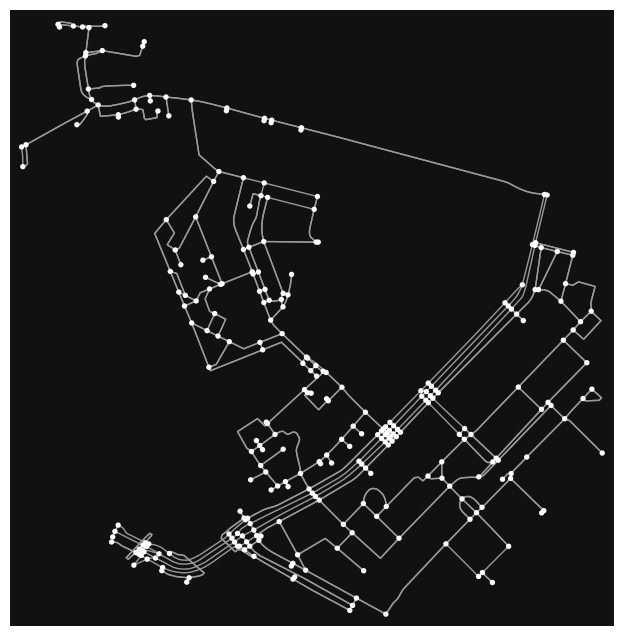

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [55]:
#the x and y coordinate of the finish of the swimming route
x_coor = 52.372870
y_coor = 4.914240
#parameter dist_type=network, ensures that the only networks & nodes are walking distance away.
point_graph = ox.graph.graph_from_point((x_coor, y_coor), dist = 750, network_type='all', dist_type = "network")

ox.plot_graph(point_graph)

In [56]:
#create geodataframe out of the networkgraph
gdf_nodes =ox.utils_graph.graph_to_gdfs(point_graph, nodes=True, edges=False, node_geometry=True, fill_edge_geometry=True)
gdf_nodes.head()

,y,x,highway,street_count,geometry
osmid,,,,,
26596589,52.371154,4.915381,crossing,5,POINT (4.91538 52.37115)
26597078,52.370718,4.916394,NaN,3,POINT (4.91639 52.37072)
46381540,52.370568,4.913938,NaN,3,POINT (4.91394 52.37057)
46382043,52.370688,4.920044,NaN,3,POINT (4.92004 52.37069)
46382992,52.370872,4.913293,NaN,3,POINT (4.91329 52.37087)


<Axes: >

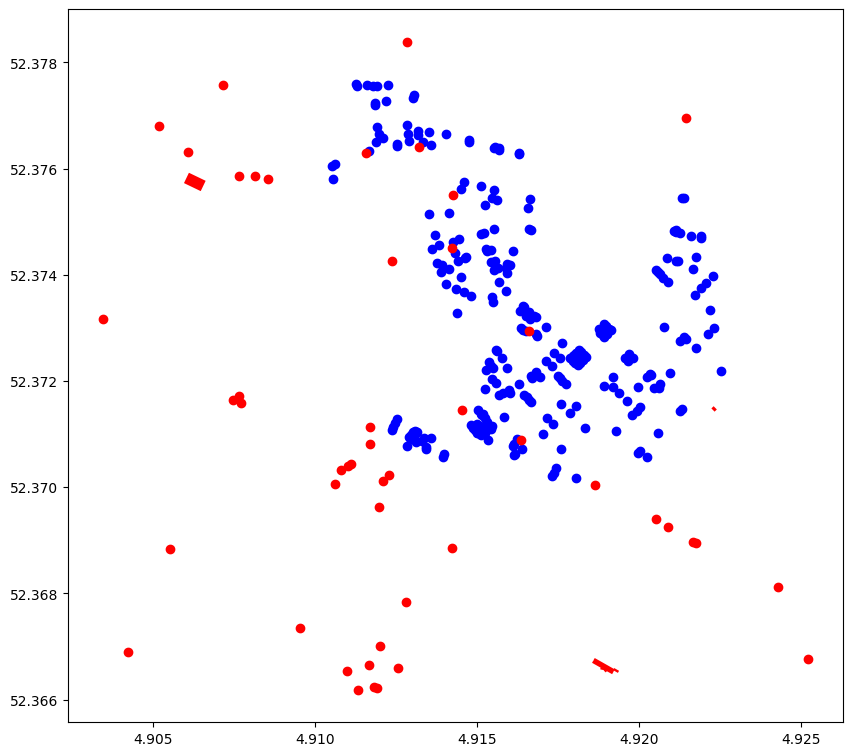

In [57]:
#find restaurants, pubs and bars in 750 meter radius, not possible yet to relate this to networkdistance
restaurant = ox.features_from_point((x_coor, y_coor), dist=750, tags={'amenity':['restaurant','pub', 'bar']})
#plot nodes and restaurants to find which are close to each other and find limits for where restaurants should be
fig, ax = plt.subplots(figsize=(10,10), sharex=True, sharey=True)
#red dots are restaurants, blue dots are nodes 750 m away
gdf_nodes.plot(color='blue', ax=ax)
restaurant.plot(color = 'red', ax=ax)

In [58]:
#retrieve x and y coordinate from point geometry in geodataframe restaurants
restaurant["x"] = restaurant.centroid.x
restaurant["y"] = restaurant.centroid.y

#box for where restaurant coordinates should be in between
north_end = 52.378
south_end = 52.370
west_end = 4.910
east_end = 4.923

#create a dataframe with names and coordinates
df_restaurant = restaurant[['name', 'x', 'y']].copy()
#copy only rows within the box
df_copy = df_restaurant[df_restaurant["x"]>= west_end].copy()
df_copy2 = df_copy[df_copy["x"]<= east_end].copy()
df_copy3 =df_copy2[df_copy2["y"]<= north_end].copy()
df_closeby_restaurant = df_copy3[df_copy3["y"]>= south_end].copy()
#df_closeby_restaurant shows a list of 31 restaurants that are near the finish of the swimming route
df_closeby_restaurant

C:\Users\julia\AppData\Local\Temp\ipykernel_26256\1533977576.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  restaurant["x"] = restaurant.centroid.x
C:\Users\julia\AppData\Local\Temp\ipykernel_26256\1533977576.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  restaurant["y"] = restaurant.centroid.y


name         x          y
element_type osmid                                                
node         252111330       Café Scharrebier  4.911107  52.370441
             252143918               de Kluis  4.911705  52.371134
             539128135          Eenvistweevis  4.911711  52.370818
             1386079220         Hannekes Boom  4.911579  52.376293
             1556465283             Magazzino  4.921443  52.376950
             2708542899           Cafe Kadijk  4.912107  52.370114
             2741083814              De Druif  4.910610  52.370054
             2743482771      Café Daan & Daan  4.916357  52.370886
             3915502820      Pension Homeland  4.916618  52.372950
             4470032578         Scheepskameel  4.914274  52.375501
             4572310445       Mediamatic Eten  4.913202  52.376404
             5211679121  Restaurant Stalpaert  4.914544  52.371456
             5909685709   DAK restaurant Nemo  4.912369  52.374268
             7775051521           Kilimanjaro  4.910815  52.370328
             7775080631              A Tavola  4.912272  52.370227
             7775116996                Verena  4.911013  52.370407
             7879970529             Kanteen25  4.914224  52.374511
             8815796628       Vegan Sushi Bar  4.918629  52.370043
way          160375977        't Markerhuisje  4.922315  52.371474

In [59]:
df_closeby_restaurant.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 19 entries, ('node', 252111330) to ('way', 160375977)
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   name    19 non-null     object 
 1   x       19 non-null     float64
 2   y       19 non-null     float64
dtypes: float64(2), object(1)
memory usage: 3.2+ KB


In [60]:
# set up bounding box
north = 52.378
south = 52.370
west = 4.910
east = 4.923

boundary_polygon = Polygon([(west, north), (east, north), (east, south), (west, south), (west, north)])


In [61]:
resturants_gdf = gpd.GeoDataFrame(df_closeby_restaurant[["name", 'x', 'y']], geometry=gpd.points_from_xy(df_closeby_restaurant.x, df_closeby_restaurant.y))
#resturants_gdf = resturants_gdf.clip(boundary_polygon)

In [62]:
water = ox.geometries.geometries_from_bbox(north, south, east, west, tags={'natural' : 'water'})
water = water.clip(boundary_polygon)

C:\Users\julia\AppData\Local\Temp\ipykernel_26256\995979757.py:1: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  water = ox.geometries.geometries_from_bbox(north, south, east, west, tags={'natural' : 'water'})


In [63]:
G = ox.graph_from_bbox(north, south, east, west)

In [65]:
fig, ax = plt.subplots(figsize=(200,200))
ax.set_aspect('equal')
ax.set_facecolor('white')

ox.plot_graph(G, edge_color='grey',
                        node_size=0, edge_linewidth=10,
                        show=False, close=False, ax=ax,)
water.plot(ax=ax, color="lightblue")
resturants_gdf.plot(ax=ax, color ="red", markersize = 5000)
swim_route_fig = ox.plot_graph_route(graph_water, swim_route_path, route_linewidth=100, zorder=2, route_color='red', show=False, orig_dest_size=2, bgcolor='white', node_color="lightblue", edge_color="lightblue", bbox=bbox_ams_centre, close=False, ax=ax)
for _, row in resturants_gdf.iterrows():
        txt = row["name"],
        x, y, = row["geometry"].x, row["geometry"].y
        ax.text(x, y, txt, ha="right", va="bottom", fontsize =130)
plt.savefig("restaurantsnearby.png")